In [84]:
import pandas as pd
import io
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score,f1_score,classification_report,confusion_matrix
import warnings
warnings.filterwarnings("ignore")

In [85]:
%matplotlib inline

In [86]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [87]:
file_path = '/content/drive/My Drive/FinalProjectExt/Crime_Data_from_2020_to_Present.csv'
df = pd.read_csv(file_path)

# Data Preprocessing and Exploratory Data Analysis

In [88]:
df.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,AO,Adult Other,624.0,NaN,NaN,NaN,1100 W 39TH PL,NaN,34.0141,-118.2978
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,IC,Invest Cont,624.0,NaN,NaN,NaN,700 S HILL ST,NaN,34.0459,-118.2545
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,AA,Adult Arrest,845.0,NaN,NaN,NaN,200 E 6TH ST,NaN,34.0448,-118.2474
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,IC,Invest Cont,745.0,998.0,NaN,NaN,5400 CORTEEN PL,NaN,34.1685,-118.4019
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,IC,Invest Cont,740.0,NaN,NaN,NaN,14400 TITUS ST,NaN,34.2198,-118.4468


In [89]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 862906 entries, 0 to 862905
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           862906 non-null  int64  
 1   Date Rptd       862906 non-null  object 
 2   DATE OCC        862906 non-null  object 
 3   TIME OCC        862906 non-null  int64  
 4   AREA            862906 non-null  int64  
 5   AREA NAME       862906 non-null  object 
 6   Rpt Dist No     862906 non-null  int64  
 7   Part 1-2        862906 non-null  int64  
 8   Crm Cd          862906 non-null  int64  
 9   Crm Cd Desc     862906 non-null  object 
 10  Mocodes         749241 non-null  object 
 11  Vict Age        862906 non-null  int64  
 12  Vict Sex        757597 non-null  object 
 13  Vict Descent    757584 non-null  object 
 14  Premis Cd       862886 non-null  float64
 15  Premis Desc     862398 non-null  object 
 16  Weapon Used Cd  299647 non-null  float64
 17  Weapon Des

In [90]:
col = ['Date Rptd','DR_NO','AREA', 'Mocodes', 'Part 1-2', 'Status', 'Vict Age', 'Vict Sex', 'Vict Descent', 'Premis Desc', 'Weapon Desc', 'Status Desc', 'Crm Cd 1', 'Crm Cd 2', 'Crm Cd 3', 'Crm Cd 4', 'Cross Street','Weapon Used Cd']
df = df.drop(col,axis=1)

In [91]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 862906 entries, 0 to 862905
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   DATE OCC     862906 non-null  object 
 1   TIME OCC     862906 non-null  int64  
 2   AREA NAME    862906 non-null  object 
 3   Rpt Dist No  862906 non-null  int64  
 4   Crm Cd       862906 non-null  int64  
 5   Crm Cd Desc  862906 non-null  object 
 6   Premis Cd    862886 non-null  float64
 7   LOCATION     862906 non-null  object 
 8   LAT          862906 non-null  float64
 9   LON          862906 non-null  float64
dtypes: float64(3), int64(3), object(4)
memory usage: 65.8+ MB


In [92]:
df.isna().sum()/df.shape[0]

DATE OCC       0.000000
TIME OCC       0.000000
AREA NAME      0.000000
Rpt Dist No    0.000000
Crm Cd         0.000000
Crm Cd Desc    0.000000
Premis Cd      0.000023
LOCATION       0.000000
LAT            0.000000
LON            0.000000
dtype: float64

In [93]:
df.dropna(inplace=True)

In [94]:
df.isna().sum()/df.shape[0]

DATE OCC       0.0
TIME OCC       0.0
AREA NAME      0.0
Rpt Dist No    0.0
Crm Cd         0.0
Crm Cd Desc    0.0
Premis Cd      0.0
LOCATION       0.0
LAT            0.0
LON            0.0
dtype: float64

In [95]:
df.head()

,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Crm Cd,Crm Cd Desc,Premis Cd,LOCATION,LAT,LON
0,01/08/2020 12:00:00 AM,2230,Southwest,377,624,BATTERY - SIMPLE ASSAULT,501.0,1100 W 39TH PL,34.0141,-118.2978
1,01/01/2020 12:00:00 AM,330,Central,163,624,BATTERY - SIMPLE ASSAULT,102.0,700 S HILL ST,34.0459,-118.2545
2,02/13/2020 12:00:00 AM,1200,Central,155,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,726.0,200 E 6TH ST,34.0448,-118.2474
3,01/01/2020 12:00:00 AM,1730,N Hollywood,1543,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),502.0,5400 CORTEEN PL,34.1685,-118.4019
4,01/01/2020 12:00:00 AM,415,Mission,1998,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",409.0,14400 TITUS ST,34.2198,-118.4468


In [96]:
df['DATE OCC'] = pd.to_datetime(df['DATE OCC'], format='%m/%d/%Y %I:%M:%S %p')

In [97]:
df['year'] = df['DATE OCC'].dt.year
df['month'] = df['DATE OCC'].dt.month
df['day'] = df['DATE OCC'].dt.day
df['day_of_week'] = df['DATE OCC'].dt.day_name()

In [98]:
df['TIME OCC'] = df['TIME OCC'].astype('str')

In [99]:
df['TIME OCC'] = df['TIME OCC'].apply(lambda x: x.zfill(4))

In [100]:
df['hour'] = df['TIME OCC'].str[:2]
df['minute'] = df['TIME OCC'].str[2:]

In [101]:
df.head()

,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Crm Cd,Crm Cd Desc,Premis Cd,LOCATION,LAT,LON,year,month,day,day_of_week,hour,minute
0,2020-01-08,2230,Southwest,377,624,BATTERY - SIMPLE ASSAULT,501.0,1100 W 39TH PL,34.0141,-118.2978,2020,1,8,Wednesday,22,30
1,2020-01-01,0330,Central,163,624,BATTERY - SIMPLE ASSAULT,102.0,700 S HILL ST,34.0459,-118.2545,2020,1,1,Wednesday,03,30
2,2020-02-13,1200,Central,155,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,726.0,200 E 6TH ST,34.0448,-118.2474,2020,2,13,Thursday,12,00
3,2020-01-01,1730,N Hollywood,1543,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),502.0,5400 CORTEEN PL,34.1685,-118.4019,2020,1,1,Wednesday,17,30
4,2020-01-01,0415,Mission,1998,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",409.0,14400 TITUS ST,34.2198,-118.4468,2020,1,1,Wednesday,04,15


In [102]:
print(len(df["Crm Cd"].unique()))

139


In [103]:
df.columns

Index(['DATE OCC', 'TIME OCC', 'AREA NAME', 'Rpt Dist No', 'Crm Cd',
       'Crm Cd Desc', 'Premis Cd', 'LOCATION', 'LAT', 'LON', 'year', 'month',
       'day', 'day_of_week', 'hour', 'minute'],
      dtype='object')

In [104]:
df['Crm Cd Desc']

0                                  BATTERY - SIMPLE ASSAULT
1                                  BATTERY - SIMPLE ASSAULT
2                 SEX OFFENDER REGISTRANT OUT OF COMPLIANCE
3                  VANDALISM - MISDEAMEANOR ($399 OR UNDER)
4         VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...
                                ...                        
862901       ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT
862902       ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT
862903                                           PICKPOCKET
862904             VANDALISM - MISDEAMEANOR ($399 OR UNDER)
862905    THEFT FROM MOTOR VEHICLE - GRAND ($950.01 AND ...
Name: Crm Cd Desc, Length: 862886, dtype: object

In [105]:
df.shape

(862886, 16)

In [106]:
def Crime_type(crime):
  types = ["STOLEN",'BATTERY','THEFT', 'BURGLARY', 'VANDALISM', 'ASSAULT', 'CRIMINAL THREATS','TRESPASSING','VIOLATION',"CRIMINAL HOMICIDE", 'CHILD ABUSE', 'RAPE','ROBBERY']

  types_name = ["MOTOR VEHICLE THEFT",'BATTERY','THEFT', 'BURGLARY', 'VANDALISM', 'ASSAULT', 'CRIMINAL THREATS', 'TRESPASSING','VIOLATION',"CRIMINAL HOMICIDE", 'CHILD ABUSE', 'RAPE','ROBBERY']

  for name,t in zip(types_name,types) :
    if t in crime:
      return name
  return "OTHERS"

In [107]:
df["Crime"] = df["Crm Cd Desc"].apply(Crime_type)

In [108]:
df["Crime"].value_counts()

THEFT                  230739
BURGLARY               118063
ASSAULT                106709
MOTOR VEHICLE THEFT    100095
BATTERY                 78989
VANDALISM               75842
OTHERS                  62422
ROBBERY                 36137
CRIMINAL THREATS        19847
VIOLATION               16883
TRESPASSING             11850
RAPE                     3959
CRIMINAL HOMICIDE        1351
Name: Crime, dtype: int64

In [109]:
df = df.drop(['Crm Cd','Crm Cd Desc'],axis = 1)
df.head()

,DATE OCC,TIME OCC,AREA NAME,Rpt Dist No,Premis Cd,LOCATION,LAT,LON,year,month,day,day_of_week,hour,minute,Crime
0,2020-01-08,2230,Southwest,377,501.0,1100 W 39TH PL,34.0141,-118.2978,2020,1,8,Wednesday,22,30,BATTERY
1,2020-01-01,0330,Central,163,102.0,700 S HILL ST,34.0459,-118.2545,2020,1,1,Wednesday,03,30,BATTERY
2,2020-02-13,1200,Central,155,726.0,200 E 6TH ST,34.0448,-118.2474,2020,2,13,Thursday,12,00,OTHERS
3,2020-01-01,1730,N Hollywood,1543,502.0,5400 CORTEEN PL,34.1685,-118.4019,2020,1,1,Wednesday,17,30,VANDALISM
4,2020-01-01,0415,Mission,1998,409.0,14400 TITUS ST,34.2198,-118.4468,2020,1,1,Wednesday,04,15,VANDALISM


In [110]:
df.Crime.value_counts()

THEFT                  230739
BURGLARY               118063
ASSAULT                106709
MOTOR VEHICLE THEFT    100095
BATTERY                 78989
VANDALISM               75842
OTHERS                  62422
ROBBERY                 36137
CRIMINAL THREATS        19847
VIOLATION               16883
TRESPASSING             11850
RAPE                     3959
CRIMINAL HOMICIDE        1351
Name: Crime, dtype: int64

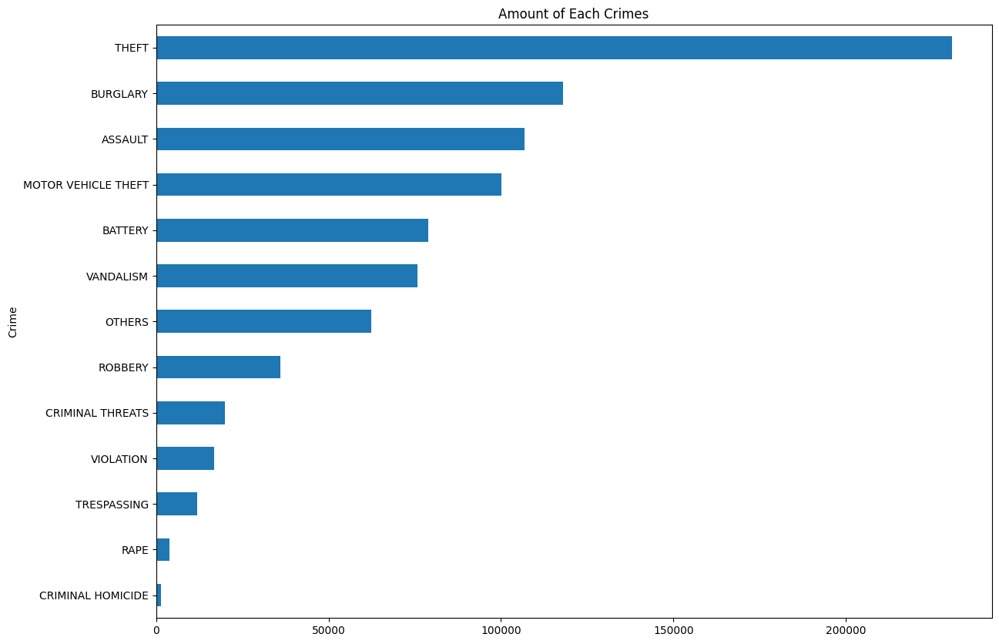

In [111]:
plt.figure(figsize=(14,10))
plt.title('Amount of Each Crimes')
plt.ylabel('Crime Type')
plt.xlabel('Amount of Crimes')
df.groupby([df['Crime']]).size().sort_values(ascending=True).plot(kind='barh')
plt.show()

In [112]:
crime_types_to_update = ['OTHERS','CRIMINAL THREATS', 'VIOLATION', 'TRESPASSING', 'RAPE', 'CRIMINAL HOMICIDE']

In [113]:
df.loc[df['Crime'].isin(crime_types_to_update), 'Crime'] = 'OTHERS'

In [114]:
df['Crime'].value_counts()

THEFT                  230739
BURGLARY               118063
OTHERS                 116312
ASSAULT                106709
MOTOR VEHICLE THEFT    100095
BATTERY                 78989
VANDALISM               75842
ROBBERY                 36137
Name: Crime, dtype: int64

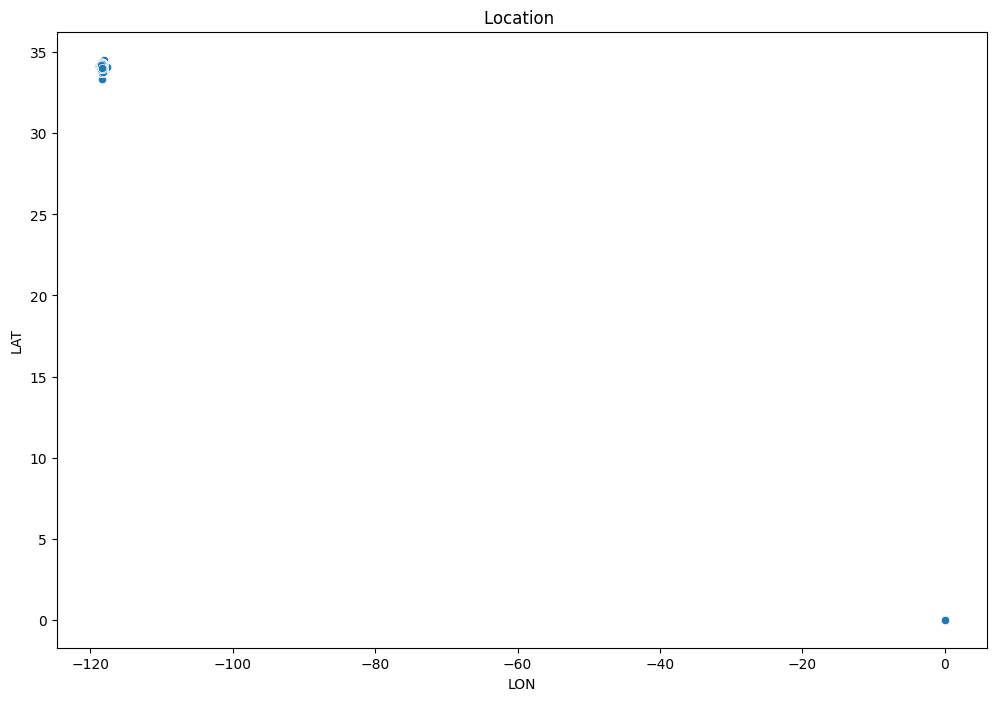

In [115]:
plt.figure(figsize=(12,8))
plt.title("Location ");
sns.scatterplot(x="LON",y="LAT",data=df);

In [116]:
df = df.drop(index = df[( df["LAT"] == 0 ) | ( df["LON"] == 0) ].index)

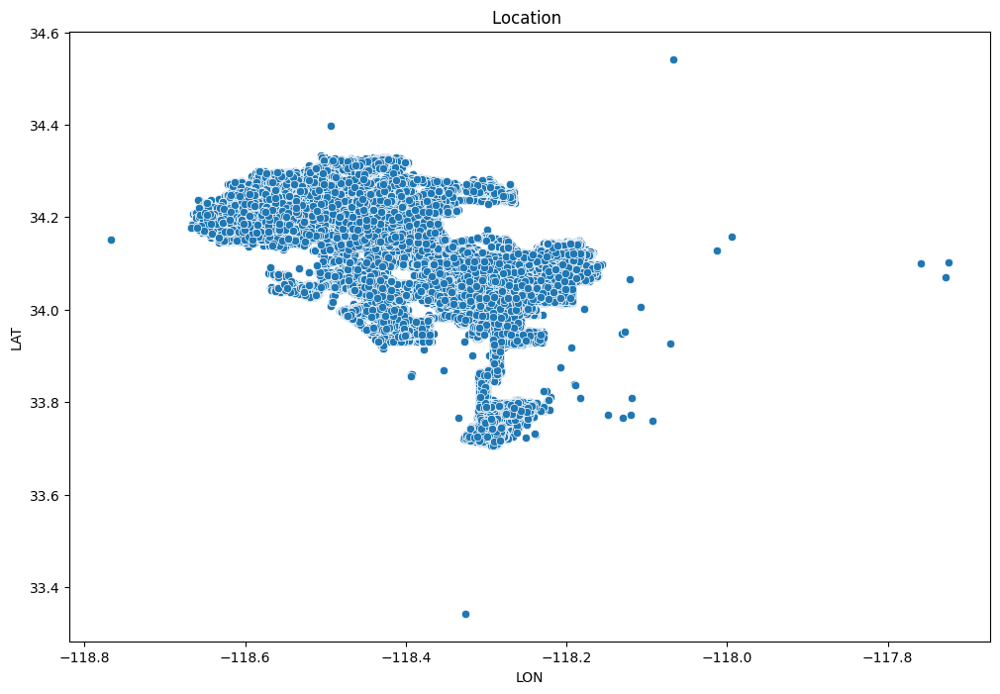

In [117]:
plt.figure(figsize=(12,8))
plt.title("Location ");
sns.scatterplot(x="LON",y="LAT",data=df);

In [118]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 861692 entries, 0 to 862905
Data columns (total 15 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   DATE OCC     861692 non-null  datetime64[ns]
 1   TIME OCC     861692 non-null  object        
 2   AREA NAME    861692 non-null  object        
 3   Rpt Dist No  861692 non-null  int64         
 4   Premis Cd    861692 non-null  float64       
 5   LOCATION     861692 non-null  object        
 6   LAT          861692 non-null  float64       
 7   LON          861692 non-null  float64       
 8   year         861692 non-null  int64         
 9   month        861692 non-null  int64         
 10  day          861692 non-null  int64         
 11  day_of_week  861692 non-null  object        
 12  hour         861692 non-null  object        
 13  minute       861692 non-null  object        
 14  Crime        861692 non-null  object        
dtypes: datetime64[ns](1), float64(3), 

In [211]:
import folium
from folium.plugins import HeatMap
# create map centered at LA
la_map = folium.Map(location=[34.0522, -118.2437], zoom_start=10)

In [212]:
heat_data = [[row['LAT'], row['LON']] for index, row in df.iterrows()]
HeatMap(heat_data, min_opacity=0.2, max_val=10).add_to(la_map)
# display map
la_map

In [119]:
df['AREA NAME'] = df['AREA NAME'].astype('category')
df['Rpt Dist No'] = df['Rpt Dist No'].astype('category')
df['Premis Cd'] = df['Premis Cd'].astype('int')
df['Premis Cd'] = df['Premis Cd'].astype('category')
#df['hour'] = df['hour'].astype('category')
#df['minute'] = df['minute'].astype('category')
#df['day'] = df['day'].astype('category')
#df['month'] = df['month'].astype('category')
df['day_of_week'] = df['day_of_week'].astype('category')

In [120]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 861692 entries, 0 to 862905
Data columns (total 15 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   DATE OCC     861692 non-null  datetime64[ns]
 1   TIME OCC     861692 non-null  object        
 2   AREA NAME    861692 non-null  category      
 3   Rpt Dist No  861692 non-null  category      
 4   Premis Cd    861692 non-null  category      
 5   LOCATION     861692 non-null  object        
 6   LAT          861692 non-null  float64       
 7   LON          861692 non-null  float64       
 8   year         861692 non-null  int64         
 9   month        861692 non-null  int64         
 10  day          861692 non-null  int64         
 11  day_of_week  861692 non-null  category      
 12  hour         861692 non-null  object        
 13  minute       861692 non-null  object        
 14  Crime        861692 non-null  object        
dtypes: category(4), datetime64[ns](1),

In [121]:
df['LOCATION'][0]

'1100 W  39TH                         PL'

In [122]:
df[['Block', 'Street']] = df['LOCATION'].str.extract(r'(\d+)\s+(.+)')
df['Street'] = df['Street'].str.replace(r'\s+', ' ').str.strip()
df[['Block', 'Street']].replace(r'^\s*$', np.nan, regex=True, inplace=True)

In [123]:
df['Block'].unique()

array(['1100', '700', '200', '5400', '14400', nan, '800', '100', '600',
       '300', '500', '2500', '2600', '400', '3000', '1800', '1200',
       '1300', '23400', '5700', '1600', '6000', '2200', '900', '1000',
       '1400', '2000', '00', '3900', '6500', '7000', '2900', '6600',
       '3100', '3800', '3500', '5800', '4300', '3200', '1700', '2100',
       '1500', '2800', '26300', '2700', '4100', '7200', '24900', '7500',
       '2300', '8400', '5600', '4900', '6900', '2400', '4000', '4600',
       '1900', '3300', '5900', '3700', '4800', '5200', '4400', '7100',
       '25300', '5000', '4500', '4200', '3600', '3400', '5100', '6200',
       '6400', '4700', '22700', '6700', '02900', '5500', '5300', '7600',
       '24700', '6100', '25400', '6300', '21100', '00900', '24400',
       '19500', '25800', '28000', '25600', '20300', '18500', '19400',
       '19700', '24100', '20600', '25500', '18600', '22500', '28100',
       '25200', '22900', '22800', '19600', '18400', '22400', '23200',
       '246

In [124]:
df = df[df['Block'] != '00']

In [125]:
df.shape

(859826, 17)

In [126]:
df = df.dropna()

In [127]:
df.isna().sum().sum()

0

In [128]:
len(df['Street'].unique())

10209

In [129]:
df.shape

(724674, 17)

In [130]:
df.describe()

,LAT,LON,year,month,day
count,724674.000000,724674.000000,724674.000000,724674.000000,724674.000000
mean,34.077412,-118.358659,2019.468876,6.393496,15.214710
std,0.113628,0.106604,4.643441,3.382525,8.974029
min,33.706100,-118.667700,2010.000000,1.000000,1.000000
25%,34.014600,-118.435500,2016.000000,3.000000,7.000000
50%,34.062000,-118.329400,2022.000000,6.000000,15.000000
75%,34.172000,-118.275600,2023.000000,9.000000,23.000000
max,34.541800,-118.013000,2023.000000,12.000000,31.000000


In [131]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 724674 entries, 0 to 862905
Data columns (total 17 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   DATE OCC     724674 non-null  datetime64[ns]
 1   TIME OCC     724674 non-null  object        
 2   AREA NAME    724674 non-null  category      
 3   Rpt Dist No  724674 non-null  category      
 4   Premis Cd    724674 non-null  category      
 5   LOCATION     724674 non-null  object        
 6   LAT          724674 non-null  float64       
 7   LON          724674 non-null  float64       
 8   year         724674 non-null  int64         
 9   month        724674 non-null  int64         
 10  day          724674 non-null  int64         
 11  day_of_week  724674 non-null  category      
 12  hour         724674 non-null  object        
 13  minute       724674 non-null  object        
 14  Crime        724674 non-null  object        
 15  Block        724674 non-null  obje

In [132]:
df.columns

Index(['DATE OCC', 'TIME OCC', 'AREA NAME', 'Rpt Dist No', 'Premis Cd',
       'LOCATION', 'LAT', 'LON', 'year', 'month', 'day', 'day_of_week', 'hour',
       'minute', 'Crime', 'Block', 'Street'],
      dtype='object')

In [133]:
#defining features for the model
features = ['LAT','LON','year','month','Crime']
df = df[features]
df.head()

,LAT,LON,year,month,Crime
0,34.0141,-118.2978,2020,1,BATTERY
1,34.0459,-118.2545,2020,1,BATTERY
2,34.0448,-118.2474,2020,2,OTHERS
3,34.1685,-118.4019,2020,1,VANDALISM
4,34.2198,-118.4468,2020,1,VANDALISM


In [136]:
sampled_df = df.sample(n=50000, random_state=42)
sampled_df.reset_index(drop=True, inplace=True)

In [137]:
# shape of sampled dataframe
sampled_df.shape

(50000, 5)

In [138]:
from sklearn.preprocessing import LabelEncoder
# Initializing LabelEncoder
label_encoder = LabelEncoder()
sampled_df['Crime'] = label_encoder.fit_transform(sampled_df['Crime'])

In [139]:
sampled_df.Crime.value_counts()

6    14578
2     7280
4     6724
0     5660
3     5601
7     4440
1     4210
5     1507
Name: Crime, dtype: int64

In [140]:
#from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
#encoder = OneHotEncoder(drop='first', sparse=True)
#encoded_cols = encoder.fit_transform(sampled_df[categorical_columns])

In [467]:
#encoded_df = pd.DataFrame(encoded_cols.toarray(), columns=encoder.get_feature_names_out(categorical_columns))

In [313]:
#sampled_df = sampled_df.drop(categorical_columns, axis=1)

In [314]:
#sampled_df = pd.concat([sampled_df.reset_index(drop=True), encoded_df.reset_index(drop=True)], axis=1)

In [141]:
sampled_df.head()

,LAT,LON,year,month,Crime
0,34.1119,-118.2369,2023,8,2
1,34.0656,-118.2553,2020,2,4
2,33.9635,-118.4086,2010,1,7
3,33.9455,-118.4001,2023,2,6
4,34.0473,-118.2462,2022,5,2


In [142]:
#aggregating columns to define crime count
crime_counts = df.groupby(['LAT','LON','year','month']).size().reset_index(name='crime_counts')

In [143]:
df_final = pd.merge(sampled_df, crime_counts, on=['LAT','LON','year','month'], how='left').fillna(0)

In [144]:
df_final.head()

,LAT,LON,year,month,Crime,crime_counts
0,34.1119,-118.2369,2023,8,2,2
1,34.0656,-118.2553,2020,2,4,1
2,33.9635,-118.4086,2010,1,7,2
3,33.9455,-118.4001,2023,2,6,50
4,34.0473,-118.2462,2022,5,2,4


In [145]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50000 entries, 0 to 49999
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   LAT           50000 non-null  float64
 1   LON           50000 non-null  float64
 2   year          50000 non-null  int64  
 3   month         50000 non-null  int64  
 4   Crime         50000 non-null  int64  
 5   crime_counts  50000 non-null  int64  
dtypes: float64(2), int64(4)
memory usage: 2.7 MB


In [209]:
df_predict = df_final.copy()

In [210]:
df_predict.head()

,LAT,LON,year,month,Crime,crime_counts
0,34.1119,-118.2369,2023,8,2,2
1,34.0656,-118.2553,2020,2,4,1
2,33.9635,-118.4086,2010,1,7,2
3,33.9455,-118.4001,2023,2,6,50
4,34.0473,-118.2462,2022,5,2,4


In [184]:
#Defining X & y parameters
X = df_final.drop(columns=['crime_counts'])
y = df_final['crime_counts']

In [185]:
X.head()

,LAT,LON,year,month,Crime
0,34.1119,-118.2369,2023,8,2
1,34.0656,-118.2553,2020,2,4
2,33.9635,-118.4086,2010,1,7
3,33.9455,-118.4001,2023,2,6
4,34.0473,-118.2462,2022,5,2


In [186]:
y.head()

0     2
1     1
2     2
3    50
4     4
Name: crime_counts, dtype: int64

In [187]:
# Creating a DataFrame for the next 12 months
future_months = pd.date_range(start='2024-01-01', periods=12, freq='MS')

# Initializing an empty DataFrame for the future data
future_data = pd.DataFrame()

# Assuming we take an average or a representative sample of LAT and LON
mean_lat = df_predict['LAT'].mean()
mean_lon = df_predict['LON'].mean()

# Assuming we use only unique crime types

label_encoder = LabelEncoder()
df_predict['Crime'] = label_encoder.fit_transform(df_predict['Crime'])
unique_crimes = df_predict['Crime'].unique()

for date in future_months:
    temp_df = pd.DataFrame({
        'LAT': mean_lat,
        'LON': mean_lon,
        'year': date.year,
        'month': date.month,
        'Crime': unique_crimes
    })

    future_data = pd.concat([future_data, temp_df], ignore_index=True)

# Random Forest Regression Model

In [188]:
from sklearn.ensemble import RandomForestRegressor

# Splitting the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initializing and training the RandomForestRegressor model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)


RandomForestRegressor(random_state=42)

In [189]:
y_pred = rf_model.predict(X_test)

In [190]:
from sklearn.metrics import mean_squared_error
from math import sqrt

# Calculating RMSE of RandomForestRegressor
rmse = sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE: {rmse}")

RMSE: 4.3007689033474


In [191]:
# Predicting the crime counts for the next 12 months
future_predictions = rf_model.predict(future_data)

future_data['predicted_crime_counts'] = future_predictions


In [192]:
# Aggregating predictions by month and crime type
aggregated_predictions = future_data.groupby(['year', 'month', 'Crime']).sum()['predicted_crime_counts'].reset_index()

for index, row in aggregated_predictions.iterrows():
    print(f"Year: {row['year']}, Month: {row['month']}, Crime_Type: {row['Crime']}, Predicted_Count: {row['predicted_crime_counts']}")


Year: 2024.0, Month: 1.0, Crime_Type: 0.0, Predicted_Count: 2.79
Year: 2024.0, Month: 1.0, Crime_Type: 1.0, Predicted_Count: 4.54
Year: 2024.0, Month: 1.0, Crime_Type: 2.0, Predicted_Count: 3.07
Year: 2024.0, Month: 1.0, Crime_Type: 3.0, Predicted_Count: 4.28
Year: 2024.0, Month: 1.0, Crime_Type: 4.0, Predicted_Count: 4.93
Year: 2024.0, Month: 1.0, Crime_Type: 5.0, Predicted_Count: 3.3
Year: 2024.0, Month: 1.0, Crime_Type: 6.0, Predicted_Count: 3.0
Year: 2024.0, Month: 1.0, Crime_Type: 7.0, Predicted_Count: 5.98
Year: 2024.0, Month: 2.0, Crime_Type: 0.0, Predicted_Count: 2.71
Year: 2024.0, Month: 2.0, Crime_Type: 1.0, Predicted_Count: 4.9
Year: 2024.0, Month: 2.0, Crime_Type: 2.0, Predicted_Count: 3.34
Year: 2024.0, Month: 2.0, Crime_Type: 3.0, Predicted_Count: 4.21
Year: 2024.0, Month: 2.0, Crime_Type: 4.0, Predicted_Count: 3.81
Year: 2024.0, Month: 2.0, Crime_Type: 5.0, Predicted_Count: 3.48
Year: 2024.0, Month: 2.0, Crime_Type: 6.0, Predicted_Count: 3.08
Year: 2024.0, Month: 2.0, Cr

# Linear Regression Model

In [193]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from math import sqrt

# Training the LinearRegression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

In [194]:
y_pred_lr = lr_model.predict(X_test)

In [195]:
# Calculating RMSE of LinearRegression Model
rmse_lr = sqrt(mean_squared_error(y_test, y_pred_lr))
print(f"Linear Regression RMSE: {rmse_lr}")

Linear Regression RMSE: 9.313820716359766


In [197]:
future_data['predicted_lr'] = lr_model.predict(future_data[['LAT', 'LON', 'year', 'month', 'Crime']])

In [198]:
# Aggregating predictions by month and crime type
aggregated_predictions = future_data.groupby(['year', 'month', 'Crime']).sum()['predicted_lr'].reset_index()

for index, row in aggregated_predictions.iterrows():
    print(f"Year: {row['year']}, Month: {row['month']}, Crime_Type: {row['Crime']}, Predicted_Count: {row['predicted_lr']}")


Year: 2024.0, Month: 1.0, Crime_Type: 0.0, Predicted_Count: 5.390970357285823
Year: 2024.0, Month: 1.0, Crime_Type: 1.0, Predicted_Count: 5.697627875567605
Year: 2024.0, Month: 1.0, Crime_Type: 2.0, Predicted_Count: 6.004285393849386
Year: 2024.0, Month: 1.0, Crime_Type: 3.0, Predicted_Count: 6.31094291213094
Year: 2024.0, Month: 1.0, Crime_Type: 4.0, Predicted_Count: 6.617600430412722
Year: 2024.0, Month: 1.0, Crime_Type: 5.0, Predicted_Count: 6.924257948694503
Year: 2024.0, Month: 1.0, Crime_Type: 6.0, Predicted_Count: 7.230915466976285
Year: 2024.0, Month: 1.0, Crime_Type: 7.0, Predicted_Count: 7.537572985257839
Year: 2024.0, Month: 2.0, Crime_Type: 0.0, Predicted_Count: 5.410955607251708
Year: 2024.0, Month: 2.0, Crime_Type: 1.0, Predicted_Count: 5.717613125533489
Year: 2024.0, Month: 2.0, Crime_Type: 2.0, Predicted_Count: 6.024270643815271
Year: 2024.0, Month: 2.0, Crime_Type: 3.0, Predicted_Count: 6.330928162096825
Year: 2024.0, Month: 2.0, Crime_Type: 4.0, Predicted_Count: 6.637

# K-Nearest Neighbors Regression Model

In [199]:
from sklearn.neighbors import KNeighborsRegressor

# Train
knn_model = KNeighborsRegressor()
knn_model.fit(X_train, y_train)

KNeighborsRegressor()

In [200]:
y_pred_knn = knn_model.predict(X_test)

In [201]:
# Calculating RMSE of KNN Model
rmse_knn = sqrt(mean_squared_error(y_test, y_pred_knn))
print(f"KNN RMSE: {rmse_knn}")

KNN RMSE: 8.303675089982749


In [202]:
future_data['predicted_knn'] = knn_model.predict(future_data[['LAT', 'LON', 'year', 'month', 'Crime']])

In [203]:
# Aggregating predictions by month and crime type
aggregated_predictions = future_data.groupby(['year', 'month', 'Crime']).sum()['predicted_knn'].reset_index()

for index, row in aggregated_predictions.iterrows():
    print(f"Year: {row['year']}, Month: {row['month']}, Crime_Type: {row['Crime']}, Predicted_Count: {row['predicted_knn']}")


Year: 2024.0, Month: 1.0, Crime_Type: 0.0, Predicted_Count: 2.0
Year: 2024.0, Month: 1.0, Crime_Type: 1.0, Predicted_Count: 2.4
Year: 2024.0, Month: 1.0, Crime_Type: 2.0, Predicted_Count: 1.4
Year: 2024.0, Month: 1.0, Crime_Type: 3.0, Predicted_Count: 4.2
Year: 2024.0, Month: 1.0, Crime_Type: 4.0, Predicted_Count: 12.2
Year: 2024.0, Month: 1.0, Crime_Type: 5.0, Predicted_Count: 6.2
Year: 2024.0, Month: 1.0, Crime_Type: 6.0, Predicted_Count: 24.8
Year: 2024.0, Month: 1.0, Crime_Type: 7.0, Predicted_Count: 1.6
Year: 2024.0, Month: 2.0, Crime_Type: 0.0, Predicted_Count: 9.6
Year: 2024.0, Month: 2.0, Crime_Type: 1.0, Predicted_Count: 3.6
Year: 2024.0, Month: 2.0, Crime_Type: 2.0, Predicted_Count: 1.8
Year: 2024.0, Month: 2.0, Crime_Type: 3.0, Predicted_Count: 2.2
Year: 2024.0, Month: 2.0, Crime_Type: 4.0, Predicted_Count: 2.4
Year: 2024.0, Month: 2.0, Crime_Type: 5.0, Predicted_Count: 8.4
Year: 2024.0, Month: 2.0, Crime_Type: 6.0, Predicted_Count: 17.2
Year: 2024.0, Month: 2.0, Crime_Type:

# Decision Tree Regression Model

In [204]:
from sklearn.tree import DecisionTreeRegressor

# Training the model
dt_model = DecisionTreeRegressor()
dt_model.fit(X_train, y_train)

DecisionTreeRegressor()

In [205]:
y_pred_dt = dt_model.predict(X_test)

In [206]:
# Calculating RMSE of Decision Tree Model
rmse_dt = sqrt(mean_squared_error(y_test, y_pred_dt))
print(f"Decision Tree RMSE: {rmse_dt}")

Decision Tree RMSE: 5.427808029029767


In [207]:
# Future Predictions
future_data['predicted_dt'] = dt_model.predict(future_data[['LAT', 'LON', 'year', 'month', 'Crime']])


In [208]:
# Aggregating predictions by month and crime type
aggregated_predictions = future_data.groupby(['year', 'month', 'Crime']).sum()['predicted_dt'].reset_index()

for index, row in aggregated_predictions.iterrows():
    print(f"Year: {row['year']}, Month: {row['month']}, Crime_Type: {row['Crime']}, Predicted_Count: {row['predicted_dt']}")


Year: 2024.0, Month: 1.0, Crime_Type: 0.0, Predicted_Count: 3.0
Year: 2024.0, Month: 1.0, Crime_Type: 1.0, Predicted_Count: 4.0
Year: 2024.0, Month: 1.0, Crime_Type: 2.0, Predicted_Count: 4.0
Year: 2024.0, Month: 1.0, Crime_Type: 3.0, Predicted_Count: 2.0
Year: 2024.0, Month: 1.0, Crime_Type: 4.0, Predicted_Count: 1.0
Year: 2024.0, Month: 1.0, Crime_Type: 5.0, Predicted_Count: 1.0
Year: 2024.0, Month: 1.0, Crime_Type: 6.0, Predicted_Count: 2.0
Year: 2024.0, Month: 1.0, Crime_Type: 7.0, Predicted_Count: 3.0
Year: 2024.0, Month: 2.0, Crime_Type: 0.0, Predicted_Count: 4.0
Year: 2024.0, Month: 2.0, Crime_Type: 1.0, Predicted_Count: 4.0
Year: 2024.0, Month: 2.0, Crime_Type: 2.0, Predicted_Count: 4.0
Year: 2024.0, Month: 2.0, Crime_Type: 3.0, Predicted_Count: 8.0
Year: 2024.0, Month: 2.0, Crime_Type: 4.0, Predicted_Count: 1.0
Year: 2024.0, Month: 2.0, Crime_Type: 5.0, Predicted_Count: 1.0
Year: 2024.0, Month: 2.0, Crime_Type: 6.0, Predicted_Count: 2.0
Year: 2024.0, Month: 2.0, Crime_Type: 7.